In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
import seaborn as sns; sns.set()
from sklearn.linear_model import SGDClassifier 
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import *
import time

%matplotlib inline

In [2]:
#This loop only using all the possible data
df = pd.read_csv('final_data.csv')

In [3]:
#Check the prob of re-entry within one year
df['within_one'].sum()/df.shape[0]

0.21967410983705493

In [4]:
#Check the prob of re-entry within two year
df['within_two'].sum()/df.shape[0]

0.2727016696841682

In [5]:
df.columns

Index(['mni_no', 'dedupe_id', 'dob', 'sex', 'race', 'mar_stat', 'city',
       'state', 'zip', 'case_no', 'case_type', 'booking_no',
       'arresting_agency', 'arresting_agency_type', 'booking_date',
       'release_date', 'bail_type', 'bail_amt', 'bailed_out', 'pri_dx_value',
       'refferal_source', 'mh_treatment', 're_entry', 'age', 'after_released',
       'within_one', 'within_two'],
      dtype='object')

In [6]:
df = df.drop(['re_entry', 'age', 'mni_no', 'dedupe_id', 'dob', 'city', 'zip', 'release_date', 'case_no', 'booking_no'], axis=1)

In [7]:
df.columns

Index(['sex', 'race', 'mar_stat', 'state', 'case_type', 'arresting_agency',
       'arresting_agency_type', 'booking_date', 'bail_type', 'bail_amt',
       'bailed_out', 'pri_dx_value', 'refferal_source', 'mh_treatment',
       'after_released', 'within_one', 'within_two'],
      dtype='object')

In [8]:
df.head()

,sex,race,mar_stat,state,case_type,arresting_agency,arresting_agency_type,booking_date,bail_type,bail_amt,bailed_out,pri_dx_value,refferal_source,mh_treatment,after_released,within_one,within_two
0,MALE,WHITE,S,KS,CR,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,2011-11-20 00:00:00,SUR,2500.0,0,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,138.0,1,1
1,MALE,WHITE,S,KS,CR,OLATHE P.D.,CITY,2014-05-02 00:00:00,SUR,1500.0,1,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,557.0,0,1
2,MALE,WHITE,S,KS,CR,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,2014-12-03 00:00:00,SUR,5000.0,1,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,198.0,1,1
3,MALE,WHITE,S,KS,DV,LENEXA P.D.,CITY,2015-03-26 00:00:00,SUR,1000.0,1,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,386.0,0,1
4,MALE,WHITE,S,KS,DV,LENEXA P.D.,CITY,2016-02-24 00:00:00,SUR,2500.0,0,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,334.0,1,1


In [9]:
dummy_vals = ['sex', 'race', 'state', 'mar_stat', 'case_type', 'arresting_agency', 'arresting_agency_type', 'bail_type', 'pri_dx_value',
       'refferal_source', ]

In [10]:
#generate dummy variable for specific column
def getting_dummy(df, col):
    '''
    Helper function to create dummy variables in dataframe for specific column
    This function will return dataframe
    '''
    dummies = pd.get_dummies(df[col]).rename(columns=lambda x: str(col)+ str(x))
    df = pd.concat([df, dummies], axis=1)
    df.drop([col], inplace=True, axis=1)
    return df

In [11]:
for dummy in dummy_vals:
    df = getting_dummy(df, dummy)

In [12]:
#4 GenerateFeatures/Predictors: discretize a continuous variable 
def discrete_val(df, cols, bins=4):
    '''
    Helper function to discrete the continueous variable in dataframe into 4 bins
    This function will return dictionary mapping column name to the bin values
    '''
    for col in cols:
        new = col+'_binned'
        df[new] = pd.cut(df[col], bins, include_lowest=True, labels = range(0,bins))
        df.drop([col], inplace=True, axis=1)
    return df

In [13]:
df = discrete_val(df, ['bail_amt'], 5)

In [14]:
indepv = list(df.columns)

In [16]:
indepv.remove('after_released')

In [17]:
indepv.remove('within_one')

In [18]:
indepv.remove('within_two')

In [19]:
indepv

['booking_date',
 'bailed_out',
 'mh_treatment',
 'sexFEMALE',
 'sexMALE',
 'raceAMERICAN INDIAN OR ALASKA NATIVE',
 'raceASIAN',
 'raceBLACK OR AFRICAN AMERICAN',
 'raceWHITE',
 'stateAK',
 'stateAL',
 'stateAR',
 'stateAZ',
 'stateCA',
 'stateCH',
 'stateCO',
 'stateCT',
 'stateDC',
 'stateDR',
 'stateFL',
 'stateGA',
 'stateHI',
 'stateIA',
 'stateID',
 'stateIL',
 'stateIN',
 'stateKS',
 'stateKY',
 'stateLA',
 'stateMA',
 'stateMD',
 'stateMI',
 'stateMM',
 'stateMN',
 'stateMO',
 'stateMS',
 'stateMT',
 'stateNB',
 'stateNC',
 'stateND',
 'stateNE',
 'stateNH',
 'stateNJ',
 'stateNM',
 'stateNV',
 'stateNY',
 'stateOH',
 'stateOK',
 'stateON',
 'stateOR',
 'statePA',
 'stateSC',
 'stateSD',
 'stateTN',
 'stateTX',
 'stateUT',
 'stateVA',
 'stateWA',
 'stateWI',
 'stateWV',
 'stateWY',
 'mar_statA',
 'mar_statD',
 'mar_statM',
 'mar_statN',
 'mar_statS',
 'mar_statU',
 'mar_statW',
 'mar_statY',
 'case_typeCR',
 'case_typeDV',
 'case_typeJV',
 'arresting_agencyFAIRWAY P.D.',
 'arr

In [20]:
def temporal_split(df, time_col, start_time, mid_time, end_time):
    train = df[(df[time_col] >= start_time) & (df[time_col] < mid_time) ]
    test = df[(df[time_col] >= mid_time)  & (df[time_col] < end_time)]
    train = train.drop([time_col], axis=1)
    test = test.drop([time_col], axis=1)
    return train, test

In [21]:
indepv.remove('booking_date')

In [22]:
def split_data(train, test, y):
    '''
    Split the data into training and testing set
    
    And save them to run try different models
    '''
    x_test = test[indepv] 
    x_train = train[indepv]
    y_test = test[y]
    y_train = train[y]
    
    return x_train, x_test, y_train, y_test

In [23]:
train, test = temporal_split(df, 'booking_date', '2010-01-01', '2015-07-01', '2018-01-01' )

In [24]:
train.shape

(21151, 302)

In [25]:
test.shape

(3704, 302)

In [26]:
clfs = {'RF': RandomForestClassifier(),
    'Boost': AdaBoostClassifier(DecisionTreeClassifier(max_depth=1)),
    'Logit': LogisticRegression(),
    'SVM': SVC(probability=True, random_state=0),
    'Tree': DecisionTreeClassifier(),
    'Bag': BaggingClassifier(),
    'KNN': KNeighborsClassifier(),
    'ET': ExtraTreesClassifier(n_estimators=10, n_jobs=-1, criterion='entropy'),
    'NB': GaussianNB()}

small_grid = {'RF':{'n_estimators': [10,100], 'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10]},
    'Boost': {'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [1,10,100,1000]},
    'Logit': {'penalty': ['l1','l2'], 'C': [0.001,0.01,0.1,1,10]},
    'SVM' :{'C' :[0.01,0.1,1,10],'kernel':['linear']},
    'Tree': {'criterion': ['gini', 'entropy'], 'max_depth': [5,10,20,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,5]},
    'Bag':{'n_estimators':[1,10,20,50], 'max_samples':[5,10], 'max_features': [5,10]},
    'KNN' :{'n_neighbors': [1,10,50],'weights': ['uniform','distance'],'algorithm': ['auto']},
    'ET': {'n_estimators': [10,100], 'criterion' : ['gini', 'entropy'] ,'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10], 'n_jobs': [-1]},
    'NB' : {}}

In [27]:
def generate_binary_at_k(y_scores, k):
    '''
    Set first k% as 1, the rest as 0.
    '''
    cutoff_index = int(len(y_scores) * (k / 100.0))
    test_predictions_binary = [1 if x < cutoff_index else 0 for x in range(len(y_scores))]
    return test_predictions_binary

In [28]:
def scores_at_k(y_true, y_scores, k):
    '''
    For a given level of k, calculate corresponding
    precision, recall, and f1 scores.
    '''
    preds_at_k = generate_binary_at_k(y_scores, k)
    precision = precision_score(y_true, preds_at_k)
    recall = recall_score(y_true, preds_at_k)
    f1 = f1_score(y_true, preds_at_k)
    return precision, recall, f1

In [29]:
def plot_precision_recall_n(y_true, y_score, model_name):
    precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_true, y_score)
    precision_curve = precision_curve[:-1]
    recall_curve = recall_curve[:-1]
    pct_above_per_thresh = []
    number_scored = len(y_score)
    for value in pr_thresholds:
        num_above_thresh = len(y_score[y_score>=value])
        pct_above_thresh = num_above_thresh / float(number_scored)
        pct_above_per_thresh.append(pct_above_thresh)
    pct_above_per_thresh = np.array(pct_above_per_thresh)
    plt.clf()
    fig, ax1 = plt.subplots()
    ax1.plot(pct_above_per_thresh, precision_curve, 'b')
    ax1.set_xlabel('percent of population')
    ax1.set_ylabel('precision', color='b')
    ax2 = ax1.twinx()
    ax2.plot(pct_above_per_thresh, recall_curve, 'r')
    ax2.set_ylabel('recall', color='r')
    
    name = model_name
    plt.title(name)
    plt.savefig(name)
    plt.show()

In [38]:
def plot(y_test, y_pred_probs, model, para = None):

    precision, recall, _ = precision_recall_curve(y_test, y_pred_probs)
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve for {} model: AUC={:.2f} \n with parameters: {}'.\
                        format(model, average_precision_score(y_test, y_pred_probs), para))
    plt.show()
    

def clf_loop(models, x_train, x_test, y_train, y_test):
    '''
    Run model with given params on x and y
    and print out the scores for comparison
    '''
    results_df = pd.DataFrame(columns=('model_type', 'parameters', 'accuracy','auc-roc', 'auc-pr', 'time', 'precision,recall,f1 at_5',
     'precision,recall,f1 at_10', 'precision,recall,f1 at_20', 'precision,recall,f1 at_30', 'precision,recall,f1 at_50'))
    for index, clf in enumerate([clfs[x] for x in models]):
        model_params = small_grid[models[index]]
        for p in ParameterGrid(model_params):
            try:
                start = time.time()
                clf.set_params(**p)
                y_pred_probs = clf.fit(x_train, y_train).predict_proba(x_test)[:,1]
                accuracy = clf.score(x_test, y_test)
                end = time.time()
                #Zip, unzip to ensure corresponding order
                y_pred_probs_sorted, y_test_sorted = zip(*sorted(zip(y_pred_probs, y_test), reverse=True))

                results_df.loc[len(results_df)] = [models[index], p, accuracy,
                                             roc_auc_score(y_test, y_pred_probs),
                                             average_precision_score(y_test, y_pred_probs), end-start,                                                     
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,5.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,10.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,20.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,30.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,50.0)]

                plot_precision_recall_n(y_test, y_pred_probs, models[index])
                
            except IndexError as e:
                print(e)
                continue
    return results_df

In [31]:
#Running classifiers to predict if the person re-enter within one years
x_train, x_test, y_train, y_test = split_data(train, test, 'within_one')

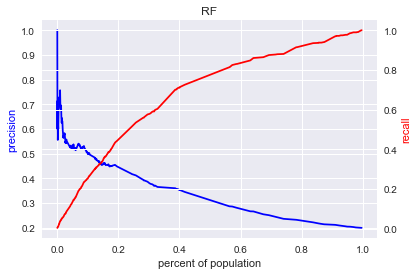

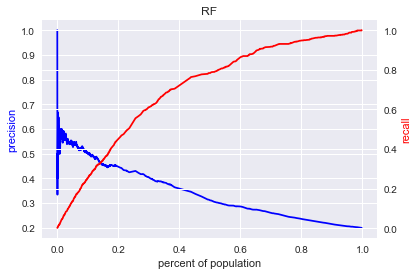

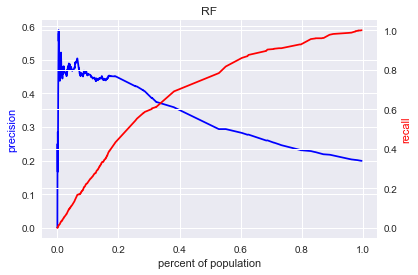

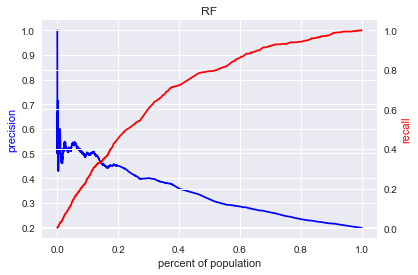

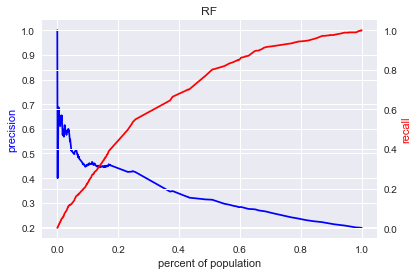

...

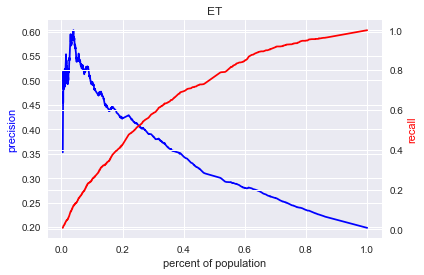

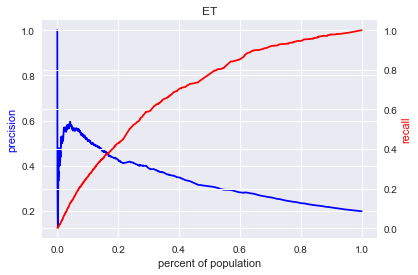

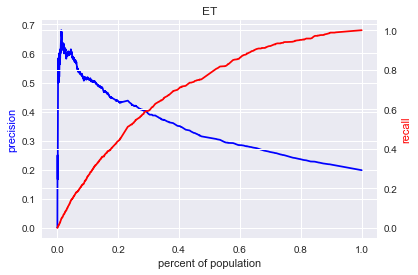

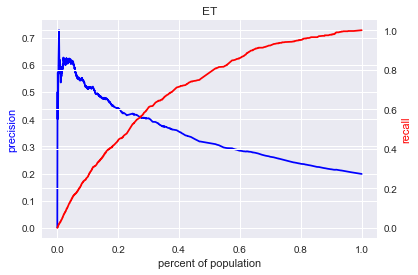

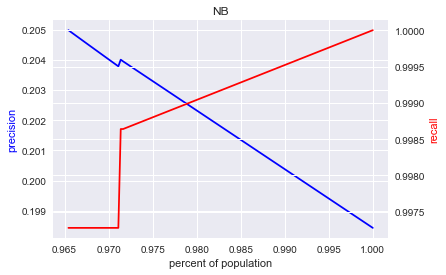

In [33]:
results = clf_loop(["RF", "Boost", "Bag", "Logit", "Tree", "KNN", "ET", "NB"], x_train, x_test, y_train, y_test)

In [34]:
from IPython.display import display
display(results)

,model_type,parameters,accuracy,auc-roc,auc-pr,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
0,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.804536,0.732723,0.410527,0.447435,"(0.5351351351351351, 0.1346938775510204, 0.215...","(0.5027027027027027, 0.2530612244897959, 0.336...","(0.4581081081081081, 0.46122448979591835, 0.45...","(0.38253825382538253, 0.5782312925170068, 0.46...","(0.3228941684665227, 0.8136054421768707, 0.462..."
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.802106,0.753506,0.418477,1.218171,"(0.5351351351351351, 0.1346938775510204, 0.215...","(0.5027027027027027, 0.2530612244897959, 0.336...","(0.45675675675675675, 0.4598639455782313, 0.45...","(0.40414041404140416, 0.6108843537414966, 0.48...","(0.31101511879049676, 0.7836734693877551, 0.44..."
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.799676,0.739846,0.384013,0.454196,"(0.4756756756756757, 0.11972789115646258, 0.19...","(0.4594594594594595, 0.23129251700680273, 0.30...","(0.4797297297297297, 0.48299319727891155, 0.48...","(0.39783978397839787, 0.601360544217687, 0.478...","(0.31047516198704106, 0.782312925170068, 0.444..."
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.802646,0.754749,0.412962,1.220114,"(0.5351351351351351, 0.1346938775510204, 0.215...","(0.5, 0.25170068027210885, 0.334841628959276)","(0.4608108108108108, 0.4639455782312925, 0.462...","(0.40414041404140416, 0.6108843537414966, 0.48...","(0.31533477321814257, 0.7945578231292517, 0.45..."
4,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.801836,0.741443,0.400844,0.495763,"(0.5405405405405406, 0.1360544217687075, 0.217...","(0.4540540540540541, 0.22857142857142856, 0.30...","(0.4918918918918919, 0.49523809523809526, 0.49...","(0.42664266426642666, 0.6448979591836734, 0.51...","(0.3180345572354212, 0.8013605442176871, 0.455..."
5,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.801566,0.748511,0.408861,1.039722,"(0.5243243243243243, 0.13197278911564625, 0.21...","(0.4972972972972973, 0.2503401360544218, 0.333...","(0.4445945945945946, 0.44761904761904764, 0.44...","(0.41134113411341133, 0.6217687074829932, 0.49...","(0.30885529157667385, 0.7782312925170068, 0.44..."
6,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.802646,0.749303,0.391791,0.413368,"(0.4864864864864865, 0.12244897959183673, 0.19...","(0.44054054054054054, 0.2217687074829932, 0.29...","(0.4608108108108108, 0.4639455782312925, 0.462...","(0.40594059405940597, 0.6136054421768707, 0.48...","(0.3347732181425486, 0.8435374149659864, 0.479..."
7,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.801566,0.741308,0.402106,0.841700,"(0.5081081081081081, 0.12789115646258503, 0.20...","(0.46216216216216216, 0.23265306122448978, 0.3...","(0.4418918918918919, 0.4448979591836735, 0.443...","(0.39873987398739874, 0.6027210884353742, 0.47...","(0.30561555075593955, 0.7700680272108843, 0.43..."
8,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.801026,0.742532,0.407636,0.767289,"(0.5459459459459459, 0.13741496598639455, 0.21...","(0.5027027027027027, 0.2530612244897959, 0.336...","(0.44594594594594594, 0.4489795918367347, 0.44...","(0.38793879387938796, 0.5863945578231292, 0.46...","(0.3093952483801296, 0.7795918367346939, 0.442..."
9,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.800486,0.748115,0.415379,4.725509,"(0.5513513513513514, 0.13877551020408163, 0.22...","(0.5054054054054054, 0.254421768707483, 0.3384...","(0.422972972972973, 0.42585034013605444, 0.424...","(0.39063906390639064, 0.5904761904761905, 0.47...","(0.31533477321814257, 0.7945578231292517, 0.45..."


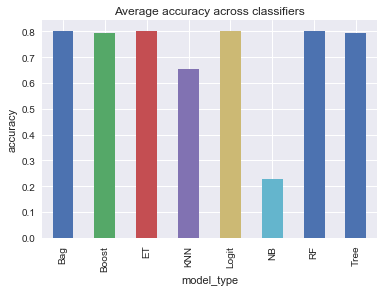

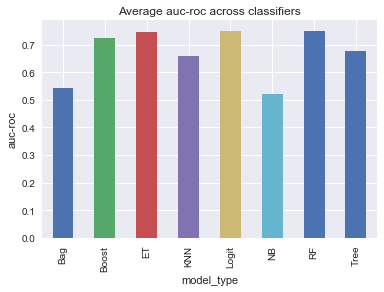

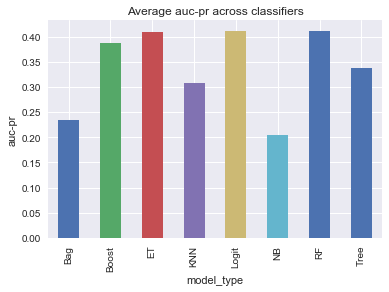

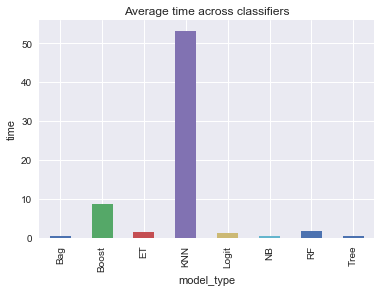

In [35]:
for item in ['accuracy', 'auc-roc','auc-pr','time']:
    plt.figure()
    results.groupby(['model_type'])[item].mean().plot(kind='bar', title='Average '+item+' across classifiers')
    plt.ylabel(item)

In [39]:
models =results.groupby('model_type')['auc-pr'].nlargest(1)

In [40]:
models

model_type     
Bag         37     0.336708
Boost       22     0.435370
ET          137    0.428689
KNN         86     0.366853
Logit       48     0.439586
NB          138    0.204967
RF          15     0.431282
Tree        58     0.411657
Name: auc-pr, dtype: float64

In [41]:
results.loc[[37, 22, 137, 86, 48, 138, 15, 58]].iloc[:,0:6]

,model_type,parameters,accuracy,auc-roc,auc-pr,time
37,Bag,"{'max_features': 10, 'max_samples': 10, 'n_est...",0.801566,0.692956,0.336708,0.443058
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.806156,0.766688,0.435370,3.576047
137,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.805346,0.755411,0.428689,2.900252
86,KNN,"{'algorithm': 'auto', 'n_neighbors': 50, 'weig...",0.708153,0.713912,0.366853,55.521859
48,Logit,"{'C': 10, 'penalty': 'l1'}",0.804266,0.767286,0.439586,3.663387
138,NB,{},0.229482,0.519873,0.204967,0.524540
15,RF,"{'max_depth': 50, 'max_features': 'log2', 'min...",0.806156,0.758374,0.431282,3.996250
58,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.802376,0.742872,0.411657,0.412015


In [42]:
results.loc[58]['parameters']

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'min_samples_split': 2}

In [43]:
#Printing out the best decision tree
dt = DecisionTreeClassifier(criterion='gini', max_depth=20, max_features='sqrt', min_samples_split=2)

In [44]:
tree = dt.fit(x_train, y_train)

In [45]:
tree_viz = export_graphviz(tree, out_file=None, feature_names=indepv, rounded=True, filled=True)
graph =graphviz.Source(tree_viz)

In [46]:
graph

In [ ]:
#Running classifiers to predict if the person re-enter within two years

In [47]:
x_train, x_test, y_train2, y_test2 = split_data(train, test, 'within_two')

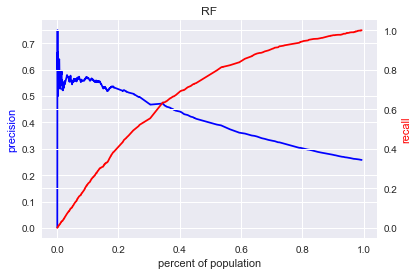

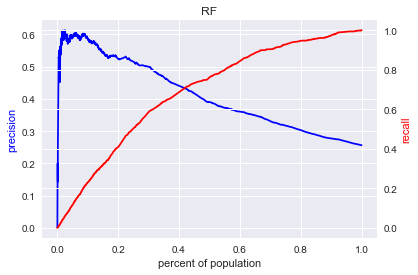

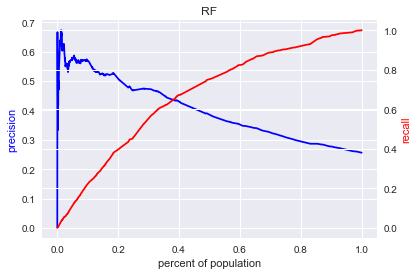

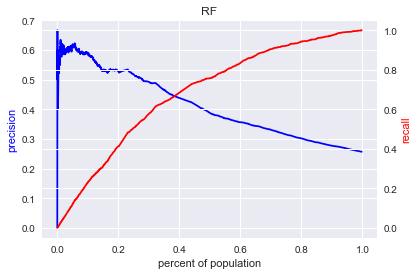

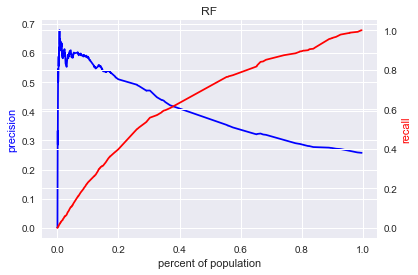

...

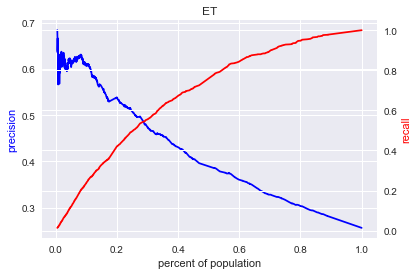

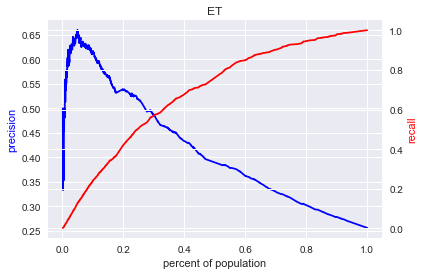

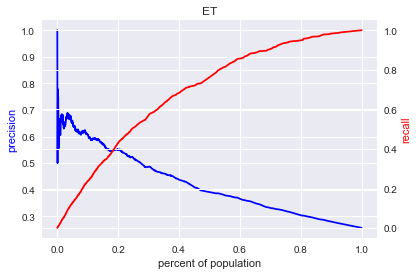

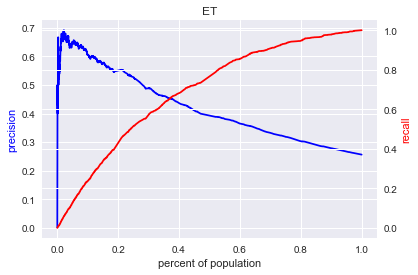

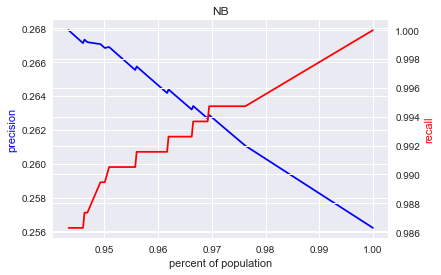

In [48]:
results2 = clf_loop(["RF", "Boost", "Bag", "Logit", "Tree", "KNN", "ET", "NB"], x_train, x_test, y_train2, y_test2)

In [49]:
from IPython.display import display
display(results2)

,model_type,parameters,accuracy,auc-roc,auc-pr,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
0,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.752430,0.746843,0.473113,0.501543,"(0.5567567567567567, 0.10853530031612224, 0.18...","(0.572972972972973, 0.22339304531085352, 0.321...","(0.5554054054054054, 0.43308746048472074, 0.48...","(0.4734473447344735, 0.5542676501580611, 0.510...","(0.408207343412527, 0.7966280295047419, 0.5398..."
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.756749,0.749694,0.481226,1.335994,"(0.5891891891891892, 0.1148577449947313, 0.192...","(0.5864864864864865, 0.22866174920969443, 0.32...","(0.5243243243243243, 0.4088514225500527, 0.459...","(0.5004500450045004, 0.5858798735511064, 0.539...","(0.39200863930885527, 0.7650158061116965, 0.51..."
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.745950,0.728297,0.460071,0.545107,"(0.572972972972973, 0.11169652265542676, 0.186...","(0.572972972972973, 0.22339304531085352, 0.321...","(0.5148648648648648, 0.40147523709167543, 0.45...","(0.48514851485148514, 0.5679662802950474, 0.52...","(0.3882289416846652, 0.7576396206533192, 0.513..."
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.756479,0.746564,0.482786,1.252876,"(0.6162162162162163, 0.12012644889357219, 0.20...","(0.5837837837837838, 0.22760800842992623, 0.32...","(0.5310810810810811, 0.41412012644889357, 0.46...","(0.495949594959496, 0.5806111696522656, 0.5349...","(0.3876889848812095, 0.7565858798735511, 0.512..."
4,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.746220,0.706717,0.451684,0.438899,"(0.5891891891891892, 0.1148577449947313, 0.192...","(0.5891891891891892, 0.2297154899894626, 0.330...","(0.5108108108108108, 0.39831401475237094, 0.44...","(0.47614761476147616, 0.5574288724973656, 0.51...","(0.39146868250539957, 0.7639620653319283, 0.51..."
5,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.744060,0.744330,0.481239,0.980737,"(0.6162162162162163, 0.12012644889357219, 0.20...","(0.5702702702702702, 0.22233930453108536, 0.31...","(0.5324324324324324, 0.41517386722866173, 0.46...","(0.504950495049505, 0.5911485774499473, 0.5446...","(0.3876889848812095, 0.7565858798735511, 0.512..."
6,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.744600,0.701379,0.429734,0.442944,"(0.5243243243243243, 0.10221285563751317, 0.17...","(0.518918918918919, 0.20231822971549, 0.291129...","(0.5540540540540541, 0.4320337197049526, 0.485...","(0.46534653465346537, 0.5447839831401475, 0.50...","(0.423866090712743, 0.827186512118019, 0.56051..."
7,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.744060,0.744574,0.481563,0.927133,"(0.5837837837837838, 0.11380400421496312, 0.19...","(0.5864864864864865, 0.22866174920969443, 0.32...","(0.5445945945945946, 0.4246575342465753, 0.477...","(0.4977497749774977, 0.5827186512118019, 0.536...","(0.3903887688984881, 0.761854583772392, 0.5162..."
8,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.762419,0.746916,0.485463,0.884653,"(0.6594594594594595, 0.1285563751317176, 0.215...","(0.6081081081081081, 0.23709167544783982, 0.34...","(0.5459459459459459, 0.42571127502634354, 0.47...","(0.47254725472547254, 0.553213909378293, 0.509...","(0.4006479481641469, 0.7818756585879874, 0.529..."
9,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.764579,0.751327,0.494846,4.859606,"(0.6378378378378379, 0.12434141201264488, 0.20...","(0.6027027027027027, 0.23498419388830347, 0.33...","(0.5486486486486486, 0.42781875658587987, 0.48...","(0.48334833483348333, 0.565858798735511, 0.521...","(0.40496760259179265, 0.7903055848261328, 0.53..."


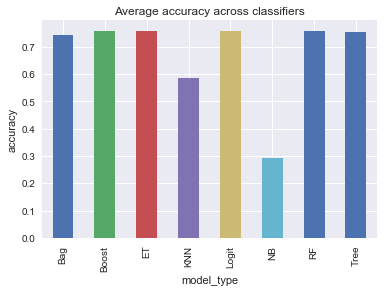

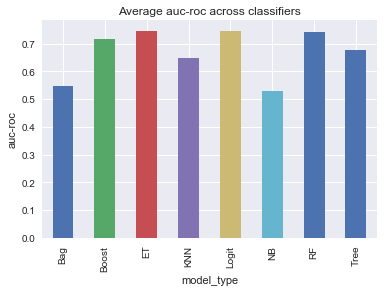

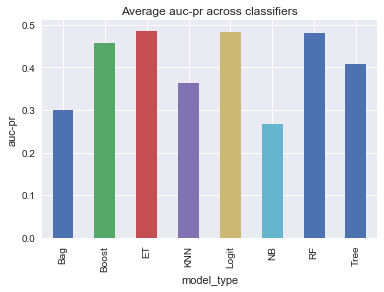

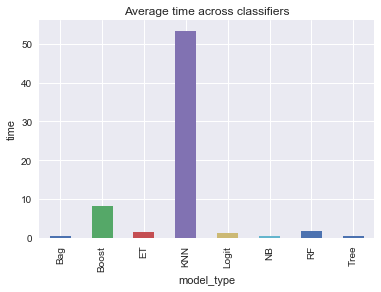

In [50]:
for item in ['accuracy', 'auc-roc','auc-pr','time']:
    plt.figure()
    results2.groupby(['model_type'])[item].mean().plot(kind='bar', title='Average '+item+' across classifiers')
    plt.ylabel(item)

In [54]:
models2 =results2.groupby('model_type')['auc-pr'].nlargest(1)

In [53]:
models2

model_type     
Bag         39     0.426905
Boost       22     0.505187
ET          137    0.502147
KNN         89     0.436563
Logit       48     0.507821
NB          138    0.267807
RF          15     0.500916
Tree        61     0.469245
Name: auc-pr, dtype: float64

In [55]:
results2.loc[[39, 22, 137, 89, 48, 138, 15, 61]].iloc[:,0:6]

,model_type,parameters,accuracy,auc-roc,auc-pr,time
39,Bag,"{'max_features': 10, 'max_samples': 10, 'n_est...",0.743790,0.684393,0.426905,0.512576
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.763229,0.759381,0.505187,3.277535
137,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.766199,0.756392,0.502147,2.951205
89,KNN,"{'algorithm': 'auto', 'n_neighbors': 100, 'wei...",0.705994,0.711746,0.436563,61.124350
48,Logit,"{'C': 10, 'penalty': 'l1'}",0.762959,0.759388,0.507821,5.301853
138,NB,{},0.290767,0.528967,0.267807,0.529300
15,RF,"{'max_depth': 50, 'max_features': 'log2', 'min...",0.765119,0.756945,0.500916,3.961455
61,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.759989,0.724738,0.469245,0.369818


In [56]:
results2.loc[61]['parameters']

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'log2',
 'min_samples_split': 5}

In [57]:
#Printing out the best decision tree
dt = DecisionTreeClassifier(criterion='gini', max_depth=20, max_features='log2', min_samples_split=5)

In [59]:
tree = dt.fit(x_train, y_train2)

In [60]:
tree_viz = export_graphviz(tree, out_file=None, feature_names=indepv, rounded=True, filled=True)
graph =graphviz.Source(tree_viz)

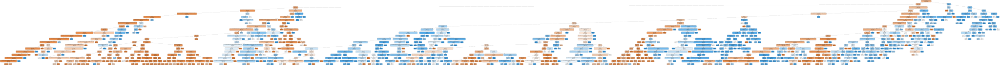

In [61]:
graph

In [62]:
results.to_csv('results_within1.csv', index=False)

In [63]:
results2.to_csv('results_within2.csv', index=False)